## Rare cell detection after integration with 3 different methods

In this notebook we assess how well rare cells (ionocytes, neuroendocrine cells, and tuft cells) can be detected after integration of datasets with three different methods: scanVI, Seurat's RPCA, and Harmony. We do the same for the final integrated atlas. We moreover generate UMAPs of the benchmark integrations, colored by final annotations.

### Import modules, set paths, choose integration to analyze:

In [1]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import sys
import os

for pretty code formatting (not necessary to run code:)

In [2]:
%load_ext lab_black

set figures to high resolution (also not necessary to run code):

In [3]:
sc.set_figure_params(dpi=140)

initiate empty dictionary in which to store figures:

In [4]:
FIGURES = dict()

set paths:

In [5]:
dir_benchmarking_res = "../../results/integration_benchmarking/benchmarking_results/"
dir_clustering = "../../results/integration_benchmarking/clustering/"
dir_results = "../../results/integration_benchmarking/rare_cell_recovery/"
dir_figures = "../../results/figures/"
path_HLCA = "../../data/HLCA_core_h5ads/HLCA_v2.h5ad"

In [6]:
datasets = [
    "HLCA",  # full atlas
    "scanvi",  # benchmarking
    "seuratrpca",  # benchmarking
    "harmony",  # benchmarking
]

In [7]:
adatas = dict()

### Perform analysis:

import the data, and the matched nested clustering. We will use the integration with optimal preprocessing for every method, as assessed via benchmarking:

In [8]:
for dataset in datasets:
    print("Dataset name:", dataset)
    if dataset == "HLCA":
        print(f"importing {dataset} data")
        adata = sc.read(path_HLCA)
    else:
        # import the integration with the best-performing preprocessing (i.e. either
        # with or without scaling, and hvg versus full feature) and the matching umap
        if dataset == "seuratrpca":
            print(f"importing {dataset} data")
            adata = sc.read(
                os.path.join(
                    dir_benchmarking_res, f"integration/unscaled/hvg/R/{dataset}.h5ad"
                )
            )
            umap = pd.read_csv(
                os.path.join(
                    dir_benchmarking_res, f"embeddings/unscaled/hvg/{dataset}_full.csv"
                ),
                index_col=0,
            )
            adata.obsm["X_umap"] = umap.loc[adata.obs.index, ["UMAP1", "UMAP2"]].values
        elif dataset == "harmony":
            print(f"importing {dataset} data")
            adata = sc.read(
                os.path.join(
                    dir_benchmarking_res, f"integration/scaled/hvg/R/{dataset}.h5ad"
                )
            )
            umap = pd.read_csv(
                os.path.join(
                    dir_benchmarking_res, f"embeddings/scaled/hvg/{dataset}_embed.csv"
                ),
                index_col=0,
            )
            adata.obsm["X_umap"] = umap.loc[adata.obs.index, ["UMAP1", "UMAP2"]].values
        elif dataset == "scanvi":
            print(f"importing {dataset} data")
            adata = sc.read(
                os.path.join(
                    dir_benchmarking_res, f"integration/unscaled/hvg/{dataset}.h5ad"
                )
            )
            umap = pd.read_csv(
                os.path.join(
                    dir_benchmarking_res, f"embeddings/unscaled/hvg/{dataset}_embed.csv"
                ),
                index_col=0,
            )
            adata.obsm["X_umap"] = umap.loc[adata.obs.index, ["UMAP1", "UMAP2"]].values
        # rename "ann_level_[1-5]" to "original_ann_level_[1-5]"
        column_renamer = {
            col: f"original_{col}"
            for col in adata.obs.columns
            if col.startswith("ann_level_")
        }
        adata.obs.rename(columns=column_renamer, inplace=True)
        # update brush/tuft cell naming. In the paper we call them tuft and
        # not brush anymore
        ct_name_updater = {ct: ct for ct in adata.obs.original_ann_level_4.unique()}
        ct_name_updater["Brush Cell/Tuft"] = "Tuft"
        adata.obs.original_ann_level_4 = adata.obs.original_ann_level_4.map(
            ct_name_updater
        )
        # import cluster assignments:
        for cl_level in ["1", "2", "3"]:
            cl_ass = pd.read_csv(
                os.path.join(
                    dir_clustering,
                    f"{dataset}/{dataset}_leiden_{cl_level}_cluster_assignment.csv",
                ),
                index_col=0,
            )
            adata.obs[f"leiden_{cl_level}"] = cl_ass.loc[
                adata.obs.index, f"leiden_{cl_level}"
            ]
    adatas[dataset] = adata

Dataset name: HLCA
importing HLCA data
Dataset name: scanvi
importing scanvi data
Dataset name: seuratrpca
importing seuratrpca data
Dataset name: harmony
importing harmony data


choose the integration to analyze (choose one of the four lines below) and select that adata for further analysis:

In [9]:
dataset_oi = "HLCA"  # full atlas
# dataset_oi = "scanvi"  # benchmarking
# dataset_oi = "seuratrpca"  # benchmarking
# dataset_oi = "harmony"  # benchmarking

In [10]:
adata = adatas[dataset_oi]

Print percentage of cells annotated as each of the three rare cell types:

In [11]:
ct_counts = adata.obs.groupby("original_ann_level_4").agg(
    {"original_ann_level_4": "count"}
)
ct_counts = ct_counts / ct_counts.sum() * 100
ct_counts.loc[["Ionocyte", "Neuroendocrine", "Tuft"], :]

,original_ann_level_4
original_ann_level_4,
Ionocyte,0.080179
Neuroendocrine,0.017438
Tuft,0.014702


Calculate cluster sizes for leiden 3 clusters (i.e. finest clusters of nested clustering):

In [12]:
cluster_sizes = (
    adata.obs.groupby("leiden_3")
    .agg({"leiden_3": "count"})
    .rename(columns={"leiden_3": "n_cells"})
)

Calculate number of rare cells per cluster (i.e. annotated at level 3 as "Rare"):

In [13]:
leiden_3_Rare_count = (
    adata.obs.groupby(["original_ann_level_3", "leiden_3"])
    .agg({"leiden_3": "count"})
    .loc["Rare", :]
    .rename(columns={"leiden_3": "n_cells"})
    .sort_values(by="n_cells", ascending=False)
)

Calculate number of level-4 annotated rare cells per cluster (i.e. annotated at level 4 as "Ionocyte", "Tuft" or "Neuroendicrone"):

In [14]:
rare_cells_cluster_ass = (
    adata.obs.groupby(["original_ann_level_4", "leiden_3"])
    .agg({"leiden_3": "count"})
    .rename(columns={"leiden_3": "n_cells"})
)

Now calculate recall (perc. of annotated rare cells recovered in cluster) and precision (percentage of cells in cluster annotated as rare cell) for each of these annotations:

In [15]:
rare_cell_recall = pd.DataFrame(index=sorted(adata.obs.leiden_3.unique()))
# neuroendocrine
rare_cell_recall["n_ne"] = 0
rare_cell_recall.loc[
    rare_cells_cluster_ass.loc["Neuroendocrine"].index, "n_ne"
] = rare_cells_cluster_ass.loc["Neuroendocrine"].n_cells
rare_cell_recall["recall_ne"] = round(
    rare_cell_recall.n_ne / rare_cell_recall.n_ne.sum(), 3
)
rare_cell_recall["prec_ne"] = round(
    rare_cell_recall.n_ne / cluster_sizes.loc[rare_cell_recall.index, "n_cells"], 3
)
# ionoctyes
rare_cell_recall["n_io"] = 0
rare_cell_recall.loc[
    rare_cells_cluster_ass.loc["Ionocyte"].index, "n_io"
] = rare_cells_cluster_ass.loc["Ionocyte"].n_cells

rare_cell_recall["recall_io"] = round(
    rare_cell_recall.n_io / rare_cell_recall.n_io.sum(), 3
)
rare_cell_recall["prec_io"] = round(
    rare_cell_recall.n_io / cluster_sizes.loc[rare_cell_recall.index, "n_cells"], 3
)
# brush/tuft
rare_cell_recall["n_brush"] = 0
rare_cell_recall.loc[
    rare_cells_cluster_ass.loc["Tuft"].index, "n_brush"
] = rare_cells_cluster_ass.loc["Tuft"].n_cells


rare_cell_recall["recall_brush"] = round(
    rare_cell_recall.n_brush / rare_cell_recall.n_brush.sum(), 3
)
rare_cell_recall["prec_brush"] = round(
    rare_cell_recall.n_brush / cluster_sizes.loc[rare_cell_recall.index, "n_cells"], 3
)
# total
rare_cell_recall["recall_Rare"] = 0

rare_cell_recall.loc[leiden_3_Rare_count.index, "recall_Rare"] = round(
    leiden_3_Rare_count.n_cells / leiden_3_Rare_count.n_cells.sum(),
    3,
)
rare_cell_recall.loc[leiden_3_Rare_count.index, "prec_Rare"] = round(
    leiden_3_Rare_count.n_cells
    / cluster_sizes.loc[leiden_3_Rare_count.index, "n_cells"],
    3,
)
# sort by total
rare_cell_recall.sort_values(by="recall_Rare", inplace=True, ascending=False)

Keep only clusters with at least one rare cell:

In [16]:
recall = rare_cell_recall.loc[rare_cell_recall.recall_Rare > 0, :]

identify top recall clusters for ionocytes, brush/tuft, and neuroendocrine:

In [17]:
io_top_cl = recall.sort_values(by="recall_io", ascending=False).index[0]
brush_top_cl = recall.sort_values(by="recall_brush", ascending=False).index[0]
if io_top_cl == brush_top_cl:
    brush_top_cl = recall.sort_values(by="recall_brush", ascending=False).index[1]
ne_top_cl = recall.sort_values(by="recall_ne", ascending=False).index[0]

Take top 3, convert fractions to percentages:

In [18]:
recall_top3 = (
    recall.loc[
        [io_top_cl, brush_top_cl, ne_top_cl], ["recall_io", "recall_brush", "recall_ne"]
    ]
    * 100
)

Rename columns:

In [19]:
recall_top3.rename(
    columns={
        "recall_ne": "% of NE cell annotations",
        "recall_io": "% of ionocyte annotations",
        "recall_brush": "% of tuft annotations",
    },
    inplace=True,
)
recall_top3.index.name = "res. 3 cluster"
# recall_top3 = recall_top3.loc[sorted(recall_top3.index.tolist()), :]

Do the same for the precision results:

In [20]:
precision_top3 = (
    recall.loc[
        [io_top_cl, brush_top_cl, ne_top_cl], ["prec_io", "prec_brush", "prec_ne"]
    ]
    * 100
)

In [21]:
precision_top3.rename(
    columns={
        "prec_ne": "NE precision",
        "prec_io": "Ionocyte precision",
        "prec_brush": "Tuft precision",
    },
    inplace=True,
)
precision_top3.index.name = "res. 3 cluster"

Remove name of column names:

In [22]:
recall_top3.columns.name = None
precision_top3.columns.name = None

Show results:

In [23]:
recall_top3

,% of ionocyte annotations,% of tuft annotations,% of NE cell annotations
res. 3 cluster,,,
0.7.0,78.3,8.1,0.0
0.7.1,1.5,75.6,0.0
0.7.2,2.1,2.3,96.1


In [24]:
precision_top3

,Ionocyte precision,Tuft precision,NE precision
res. 3 cluster,,,
0.7.0,65.4,1.2,0.0
0.7.1,4.2,39.4,0.0
0.7.2,6.3,1.3,61.6


Save result:

In [25]:
# recall_top3.to_csv(os.path.join(dir_results, f"Rare_cell_recall_{dataset_oi}.csv"))
# precision_top3.to_csv(os.path.join(dir_results, f"Rare_cell_precision_{dataset_oi}.csv"))

## Part 2: project final manual annotations on embeddings from benchmark:

In [26]:
adata_core = adatas["HLCA"]

In [27]:
adata_b = adatas[
    "scanvi"
]  # any of the benchmarking datasets (this is for barcode harmonization)

harmonize indices:

In [28]:
old_to_new_indices = adata_b.obs.loc[:, ["dataset"]].copy()
old_to_new_indices["new_index"] = None

In [29]:
for dataset in adata_b.obs.dataset.unique():
    old_idc = old_to_new_indices.loc[old_to_new_indices.dataset == dataset, :].index
    if dataset == "Sanger_Meyer_2019Madissoon":  # new name: Meyer_2019
        old_to_new_indices.loc[old_idc, "new_index"] = [
            idx.rstrip("_Meyer") for idx in old_idc
        ]  # somehow this one fails for quite a few cells, not sure why
        # partly due to additional samples filtered out?
    elif dataset in [
        "Vanderbilt_Kropski_bioRxivHabermann_vand",
        "Vanderbilt_Kropski_bioRxivHabermann_dna",
    ]:  # new name: Banovich_Kropski_2020 (for both)
        old_to_new_indices.loc[old_idc, "new_index"] = [
            "_".join([idx.split("_")[1], idx.split("_")[0]]) for idx in old_idc
        ]
    elif dataset == "CNRS_Barbry_bioRxivDeprez":  # new name: Barbry_Leroy_2020
        old_to_new_indices.loc[old_idc, "new_index"] = [
            idx.rstrip("_Barbry") for idx in old_idc
        ]
    elif dataset in [
        "Pittsburgh_Lafyatis_2019Morse_10Xv1",
        "Pittsburgh_Lafyatis_2019Morse_10Xv2",
    ]:  # new name: Lafyatis_Rojas_2019_10Xv1 or v2
        old_to_new_indices.loc[old_idc, "new_index"] = [
            "-".join(idx.split("NOR")[0].split("_")) for idx in old_idc
        ]
    elif dataset in [
        "NJH_Seibold_2020Goldfarbmuren_10Xv2",
        "NJH_Seibold_2020Goldfarbmuren_10Xv3",
    ]:  # new name: Seibold_2020_10Xv2 or v3
        old_to_new_indices.loc[old_idc, "new_index"] = [
            idx.rstrip("_Seibold") for idx in old_idc
        ]
    elif dataset == "Stanford_Krasnow_bioRxivTravaglini":  # new name: Krasnow_2020
        old_to_new_indices.loc[old_idc, "new_index"] = [
            idx.rstrip("_Krasnow") for idx in old_idc
        ]
    elif dataset == "Misharin_new":  # new name: Misharin_2021
        old_to_new_indices.loc[old_idc, "new_index"] = [
            idx.rstrip("_Misharin_new") for idx in old_idc
        ]
    elif (
        dataset == "Sanger_Teichmann_2019VieiraBraga"
    ):  # new name: Teichmann_Meyer_2019
        old_to_new_indices.loc[old_idc, "new_index"] = [
            "_".join(idx.rstrip("_Teichmann").split("_")[:2]) for idx in old_idc
        ]
    elif dataset == "UMCG_Nawijn_2019VieiraBraga":
        # cannot convert as data was anonymized...
        pass
    elif (
        dataset == "Northwestern_Misharin_2018Reyfman"
    ):  # new name: Misharin_Budinger_2018
        donor_to_sample = {
            "Donor_01": "SC07",
            "Donor_02": "SC10",
            "Donor_03": "SC18",
            "Donor_04": "SC20",
            "Donor_05": "SC22",
            "Donor_06": "SC24",
            "Donor_07": "SC27",
            "Donor_08": "SC29",
        }
        barcodes = [idx.split("_")[0] for idx in old_idc]
        donors = ["_".join(idx.split("_")[1:3]) for idx in old_idc]
        old_to_new_indices.loc[old_idc, "new_index"] = [
            "_".join([bc, donor_to_sample[donor]])
            for bc, donor in zip(barcodes, donors)
        ]

In [30]:
old_to_new_indices["idx_found_in_core"] = old_to_new_indices.new_index.isin(
    adata_core.obs.index
)

In [31]:
idc_in_core_old = old_to_new_indices.loc[old_to_new_indices.idx_found_in_core, :].index
idc_in_core_new = old_to_new_indices.loc[
    old_to_new_indices.idx_found_in_core, "new_index"
].values
old_to_new_indices["manual_ann"] = None
old_to_new_indices["manual_ann_grouped"] = None

old_to_new_indices.loc[idc_in_core_old, "manual_ann"] = adata_core.obs.loc[
    idc_in_core_new, "manual_ann"
].values
old_to_new_indices.loc[idc_in_core_old, "manual_ann_grouped"] = adata_core.obs.loc[
    idc_in_core_new, "manual_ann_grouped"
].values

In [32]:
sc.set_figure_params(figsize=(8, 8))

scanvi


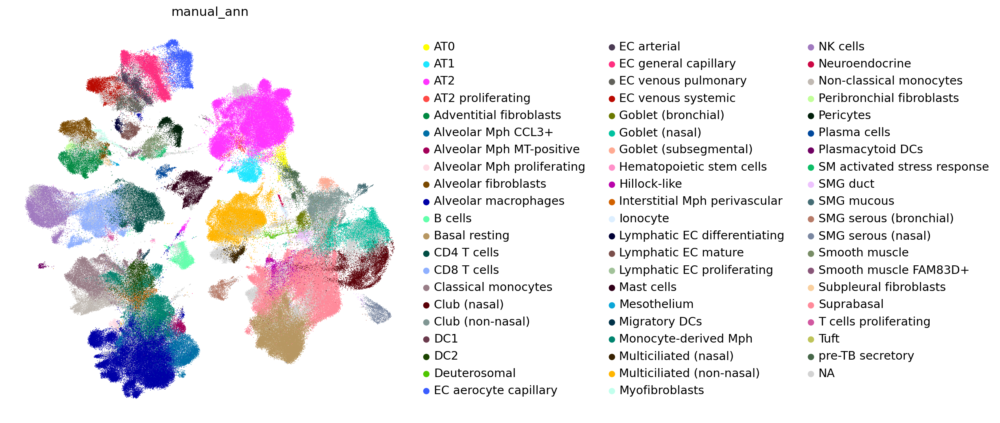

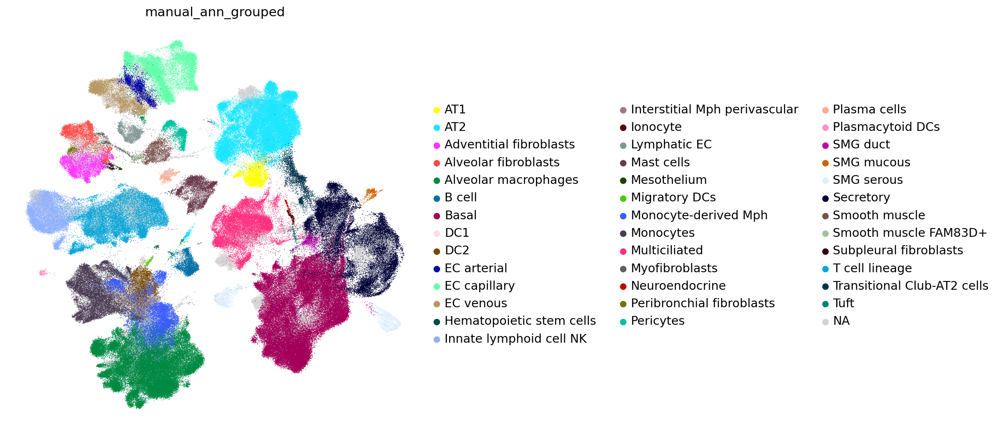

seuratrpca


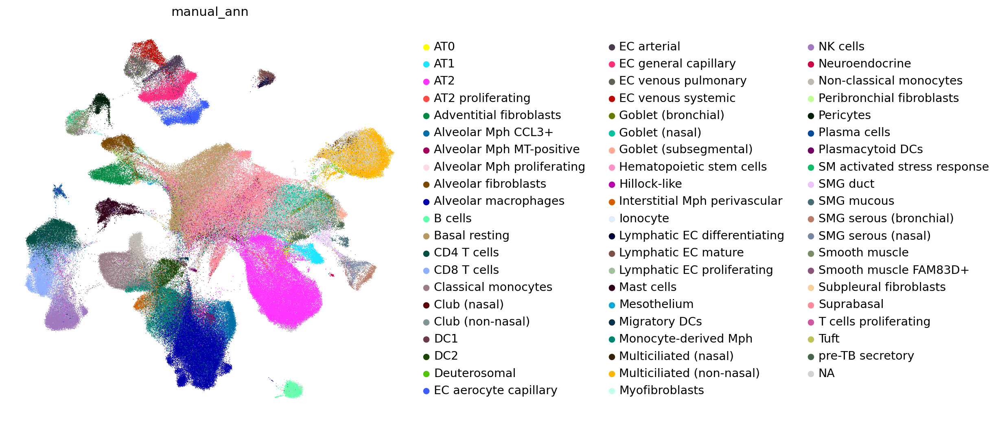

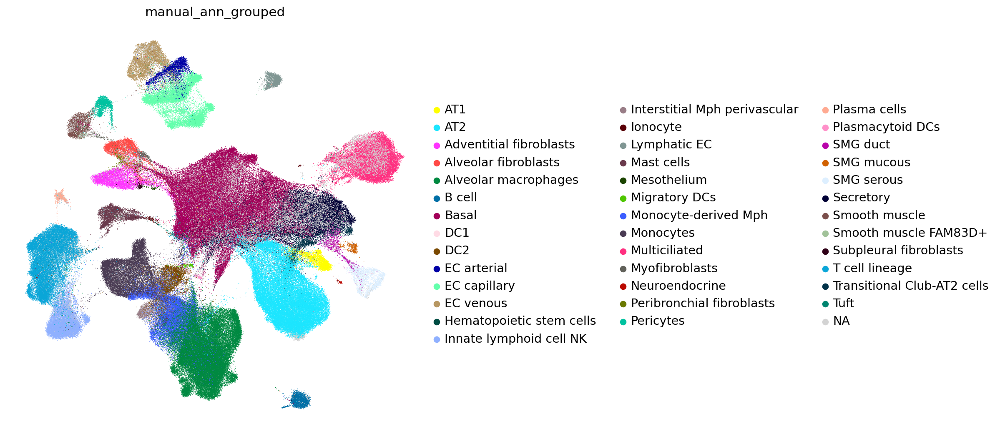

harmony


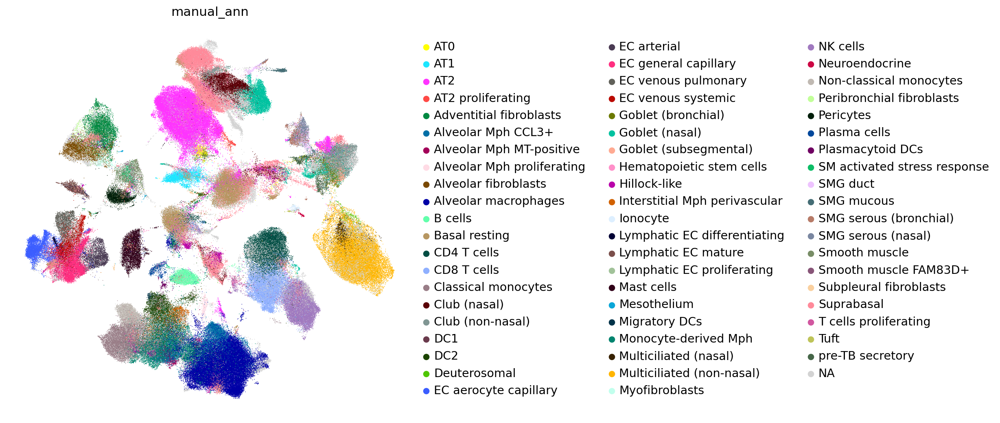

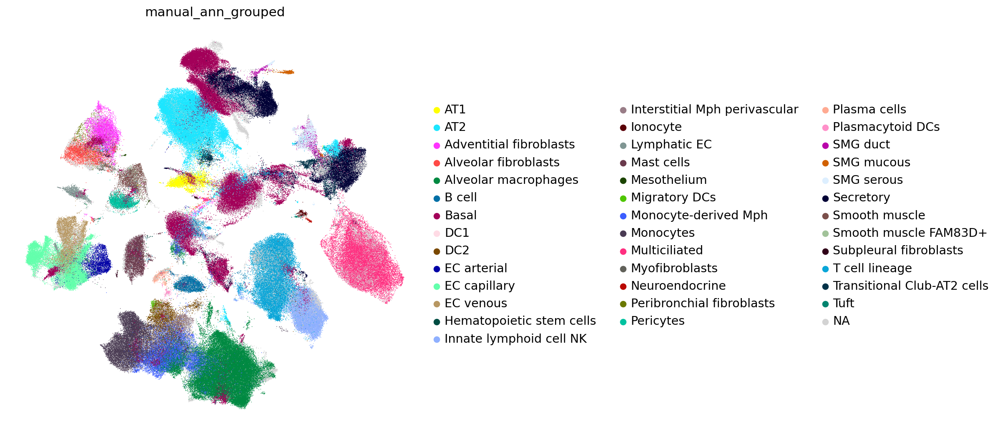

In [33]:
for dataset in datasets:
    if dataset != "HLCA":
        print(dataset)
        adata_benchmark = adatas[dataset]
        adata_benchmark.obs["manual_ann"] = old_to_new_indices.loc[
            adata_benchmark.obs.index, "manual_ann"
        ]
        adata_benchmark.obs["manual_ann_grouped"] = old_to_new_indices.loc[
            adata_benchmark.obs.index, "manual_ann_grouped"
        ]
        FIGURES[f"reviewer_benchmark_umaps_with_final_anns_{dataset}"] = sc.pl.umap(
            adata_benchmark,
            color=["manual_ann"],
            sort_order=False,
            frameon=False,
            size=2,
            return_fig=True,
        )
        FIGURES[
            f"reviewer_benchmark_umaps_with_final_coarse_anns_{dataset}"
        ] = sc.pl.umap(
            adata_benchmark,
            color=["manual_ann_grouped"],
            sort_order=False,
            frameon=False,
            size=2,
            return_fig=True,
        )
        plt.show()
        plt.close()

In [34]:
sc.set_figure_params(figsize=(10, 10))

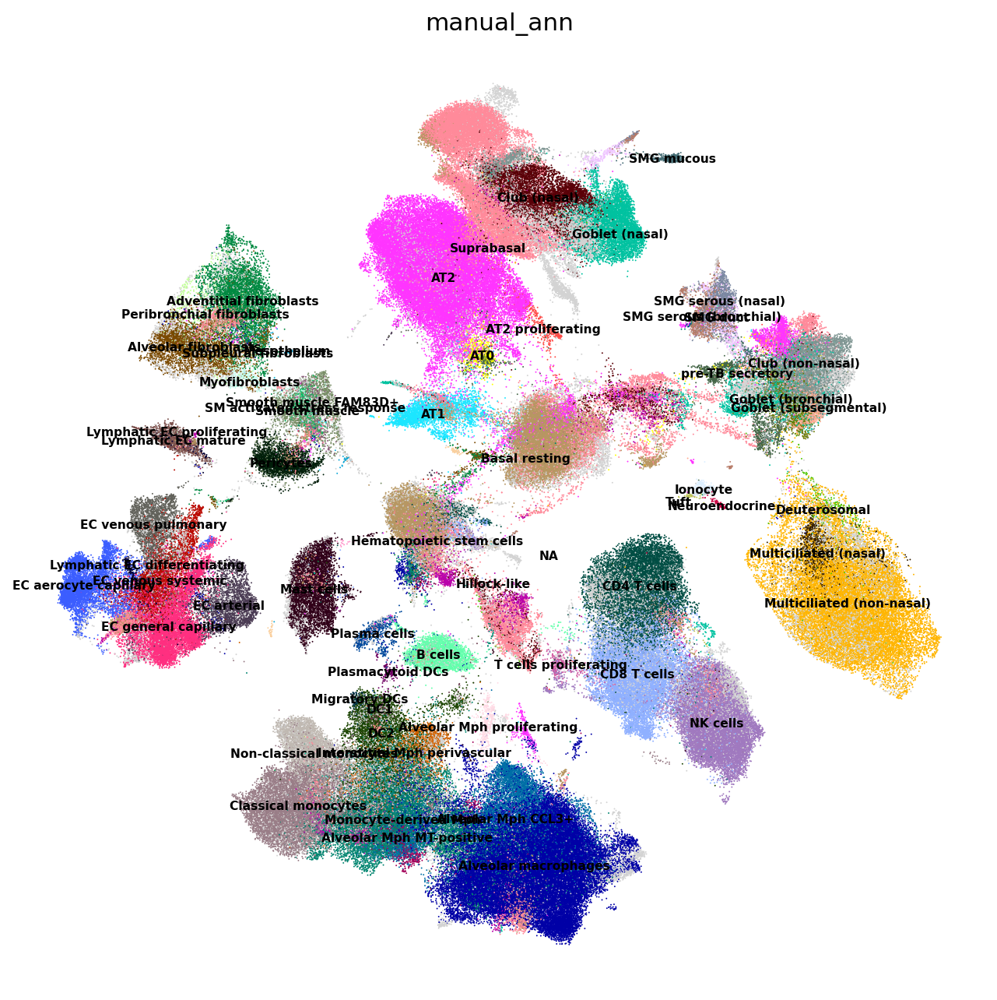

In [35]:
sc.pl.umap(
    adatas["harmony"],
    color=["manual_ann"],
    legend_loc="on data",
    legend_fontsize=7,
    sort_order=False,
    frameon=False,
    size=3,
)

Check which cell types are difficult to visually find in the seurat and harmony one:

In [36]:
sc.set_figure_params(figsize=(5, 5))

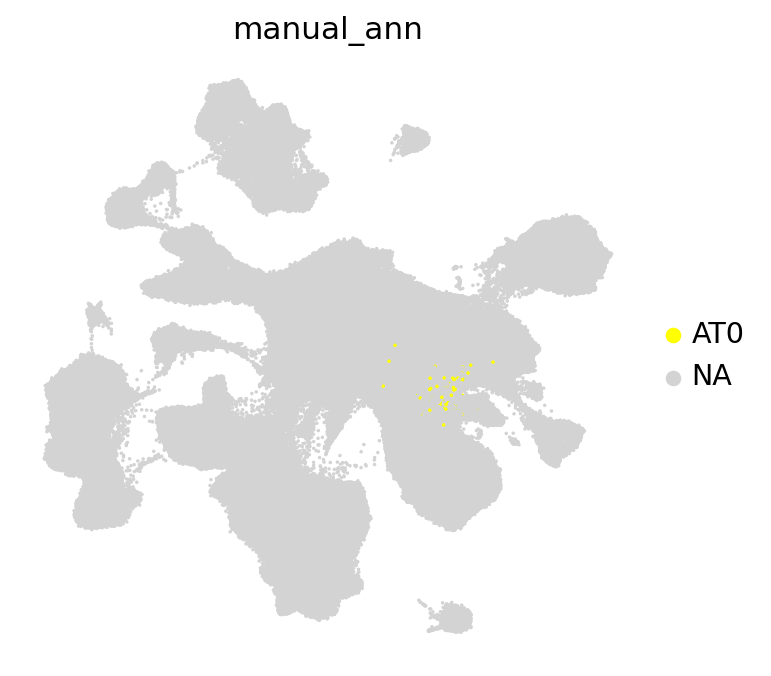

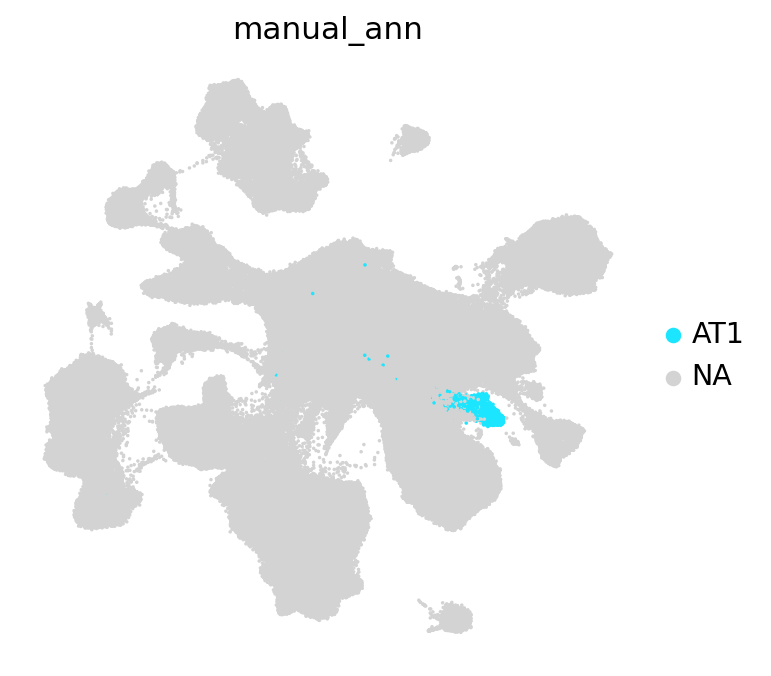

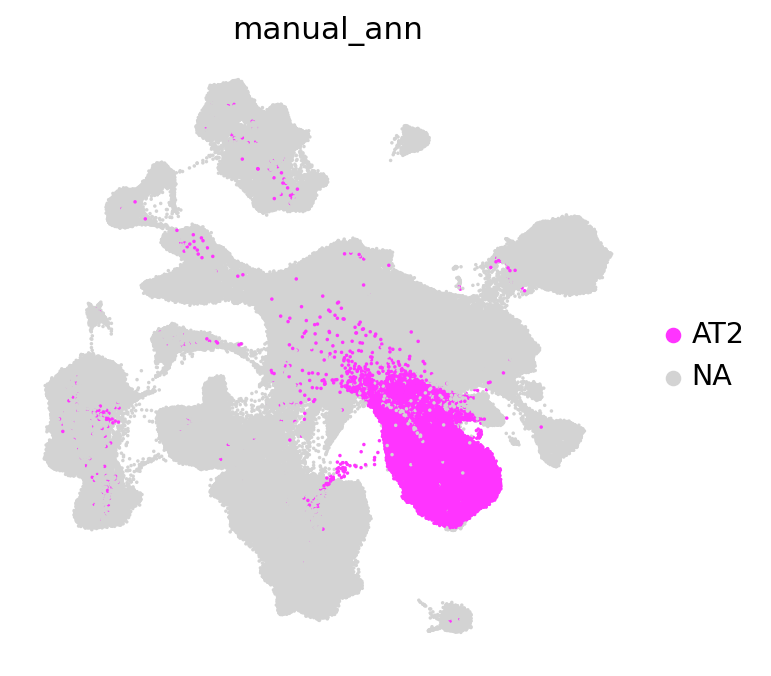

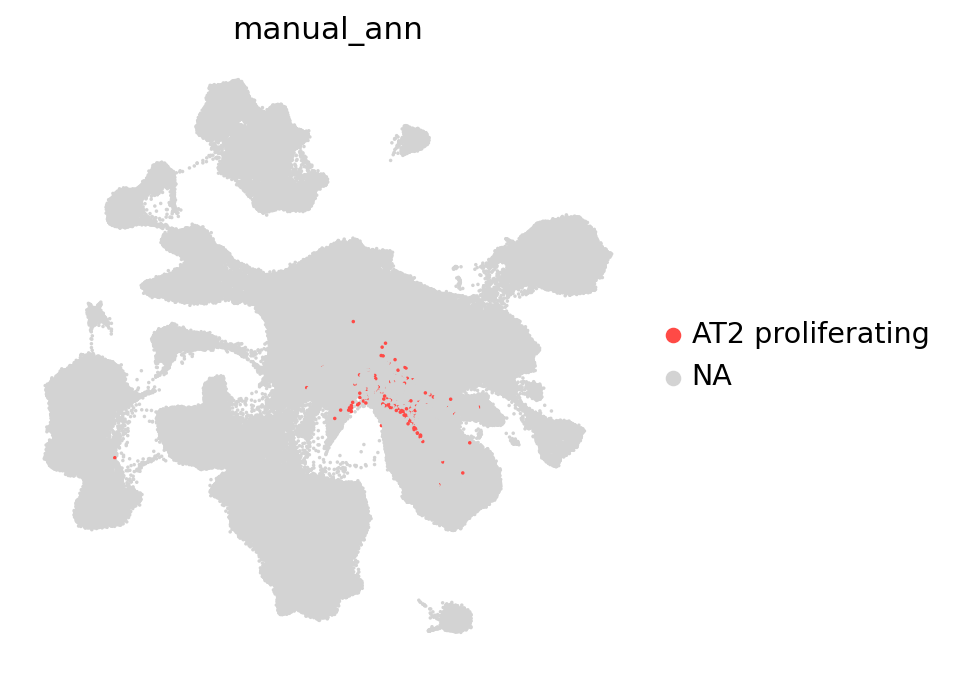

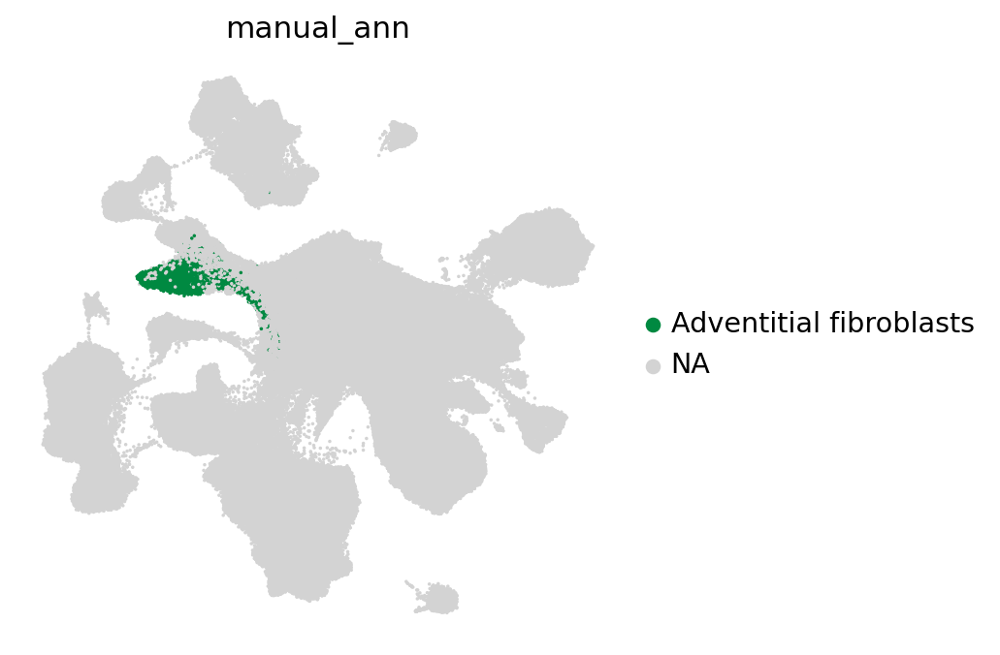

...

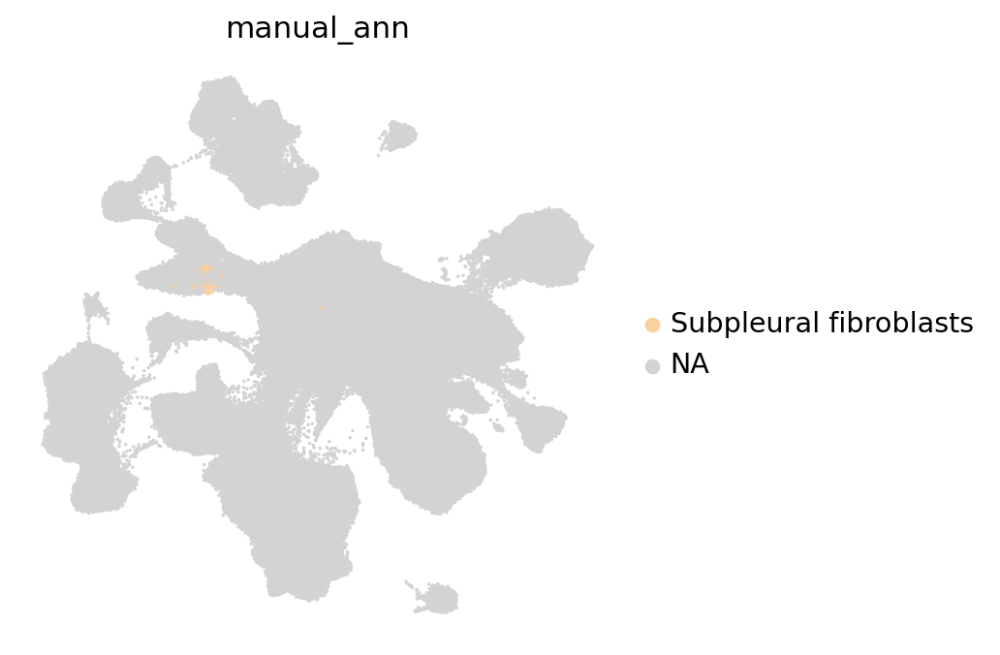

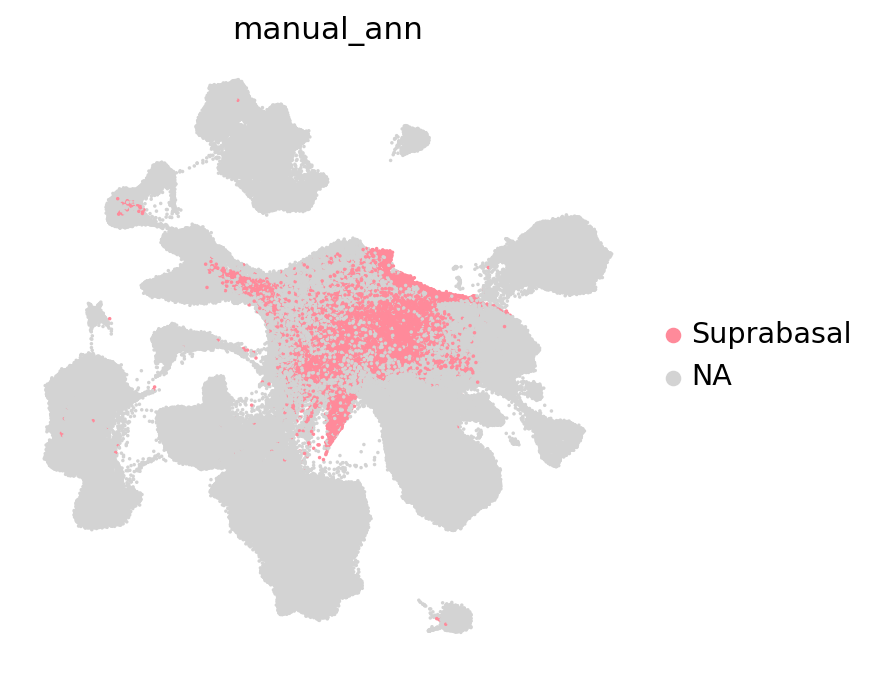

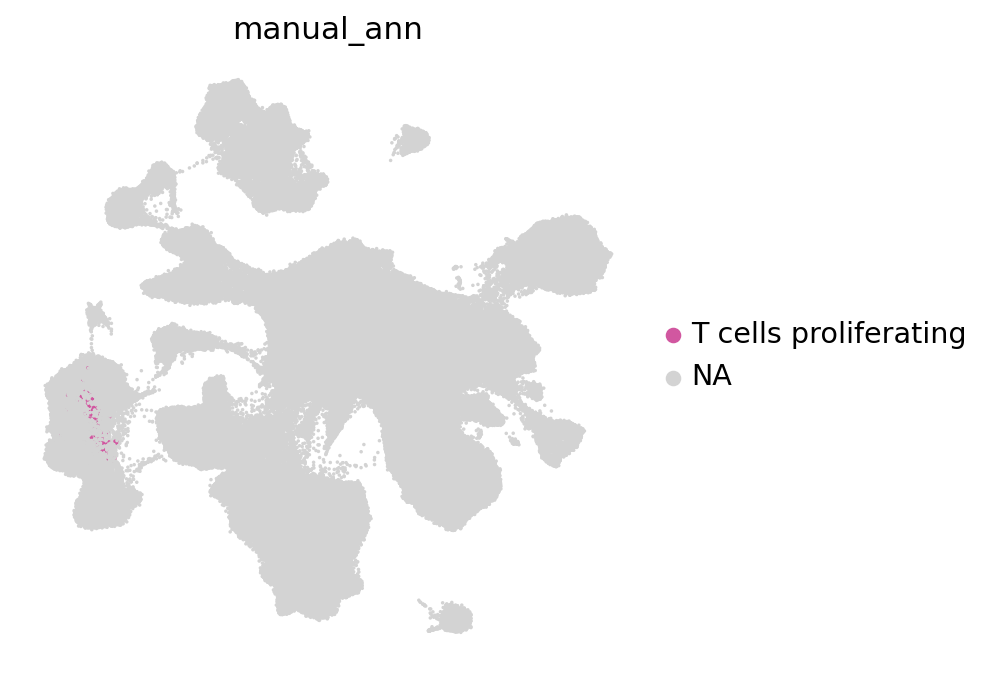

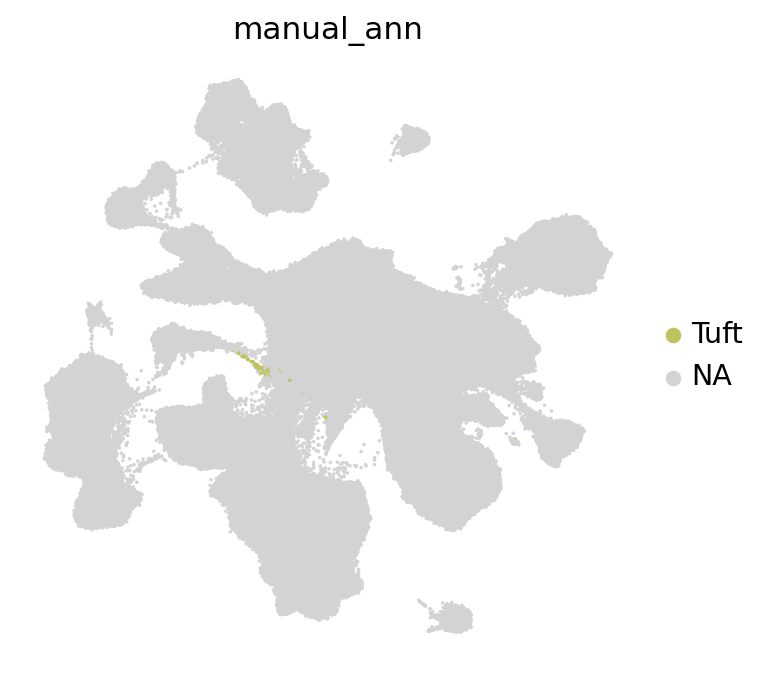

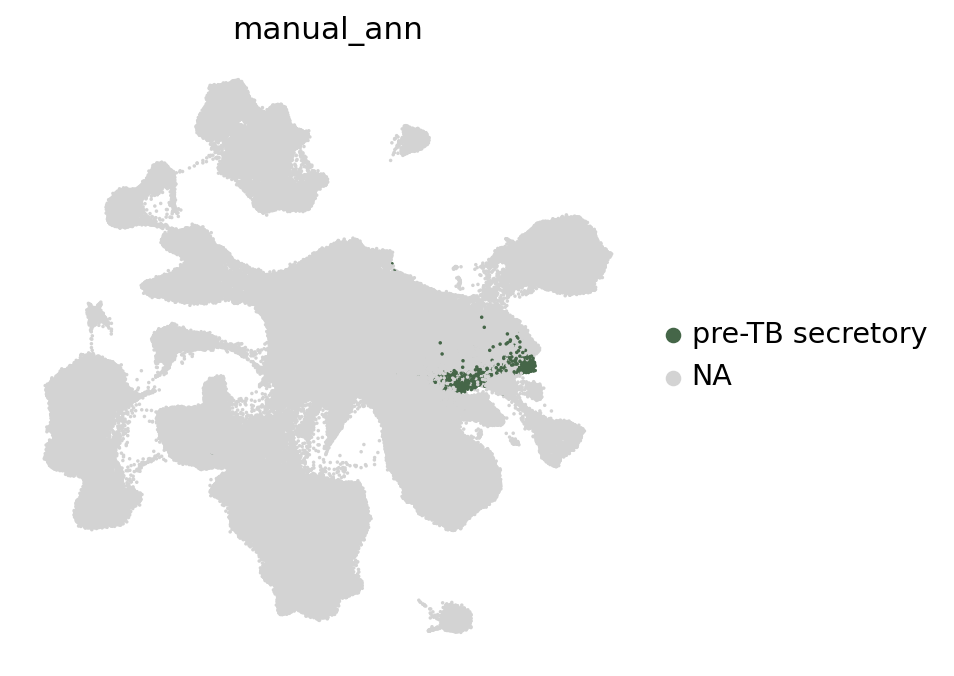

In [37]:
method = "seuratrpca"
for ct in sorted(
    [ct for ct in adatas[method].obs.manual_ann.unique() if not pd.isnull(ct)]
):
    if ct != "nan" and not pd.isnull(ct):
        sc.pl.umap(
            adatas[method],
            color=["manual_ann"],
            groups=ct,
            sort_order=False,
            frameon=False,
            size=10,
        )

## Store figures:

In [38]:
FIGURES

{'reviewer_benchmark_umaps_with_final_anns_scanvi': <Figure size 640x640 with 1 Axes>,
 'reviewer_benchmark_umaps_with_final_coarse_anns_scanvi': <Figure size 640x640 with 1 Axes>,
 'reviewer_benchmark_umaps_with_final_anns_seuratrpca': <Figure size 640x640 with 1 Axes>,
 'reviewer_benchmark_umaps_with_final_coarse_anns_seuratrpca': <Figure size 640x640 with 1 Axes>,
 'reviewer_benchmark_umaps_with_final_anns_harmony': <Figure size 640x640 with 1 Axes>,
 'reviewer_benchmark_umaps_with_final_coarse_anns_harmony': <Figure size 640x640 with 1 Axes>}

In [39]:
for figname, fig in FIGURES.items():
    print("Storing", figname)
    fig.savefig(
        os.path.join(dir_figures, f"{figname}.png"),
        bbox_inches="tight",
        dpi=140,
        transparent=True,
    )
    plt.close()

Storing reviewer_benchmark_umaps_with_final_anns_scanvi
Storing reviewer_benchmark_umaps_with_final_coarse_anns_scanvi
Storing reviewer_benchmark_umaps_with_final_anns_seuratrpca
Storing reviewer_benchmark_umaps_with_final_coarse_anns_seuratrpca
Storing reviewer_benchmark_umaps_with_final_anns_harmony
Storing reviewer_benchmark_umaps_with_final_coarse_anns_harmony
